---


STEPS

1. Add "APS360 Group Project"  as shortcut to mydrive (organize->ass shortcut -> all locations -> MyDrive)

2. Mount using cell below

---



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision
import numpy as np
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import torch.optim as optim


torch.manual_seed(1)
np.random.seed(1)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


---

#Class Imbalance

From the above, we observe that there is clearly an imbalance of classes, to suplement this, we will utilize another dataset. To deal with this class balance while miantiang an effecitve number of samples we will attmept to try Uniform Class Distribution by

*   Find smallest class
*   Sample that amount from each class
* apply a 80:10:10


---

In [ ]:
from torch.utils.data import Subset
from collections import defaultdict
import random
import math
from torchvision import transforms
from collections import defaultdict
from torch.utils.data import Subset
import random

def uniform_stratified_split(full_set, train_per_class=200, val_per_class=100, test_per_class=0):
    all_targets = full_set.targets  # Get all labels

    class_indices = defaultdict(list)
    for idx, label in enumerate(all_targets):
        class_indices[label].append(idx)

    train_idxs, val_idxs, test_idxs = [], [], []

    for label, indices in class_indices.items():
        random.shuffle(indices)

        val_idxs.extend(indices[:val_per_class])
        test_idxs.extend(indices[val_per_class:val_per_class + test_per_class])
        train_idxs.extend(indices[val_per_class + test_per_class:val_per_class + test_per_class + train_per_class])

    train_set = Subset(full_set, train_idxs)
    val_set   = Subset(full_set, val_idxs)
    test_set  = Subset(full_set, test_idxs)

    total_data = len(train_set) + len(val_set) + len(test_set)
    print(f"Classes: {full_set.classes}")
    print(f"Training images:   {len(train_set)} ({len(train_set)/total_data:.2%})")
    print(f"Validation images: {len(val_set)} ({len(val_set)/total_data:.2%})")
    print(f"Test images:       {len(test_set)} ({len(test_set)/total_data:.2%})")

    return train_set, val_set, test_set



In [ ]:
!ls "/content/drive/MyDrive/APS360 Group Project/APS 360 Project/garbage-dataset"

battery     cardboard  glass  paper    shoes
biological  clothes    metal  plastic  trash


In [ ]:
from torchvision.datasets import ImageFolder
data_transform1 = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])


full_set2 = ImageFolder(root="/content/drive/MyDrive/APS360 Group Project/APS 360 Project/garbage-dataset", transform=data_transform1)

print("we did it again")

we did it again


In [ ]:
train_set, val_set, _ = uniform_stratified_split(full_set2, train_per_class=240, val_per_class=30, test_per_class=0)

Classes: ['battery', 'biological', 'cardboard', 'clothes', 'glass', 'metal', 'paper', 'plastic', 'shoes', 'trash']
Training images:   2400 (88.89%)
Validation images: 300 (11.11%)
Test images:       0 (0.00%)


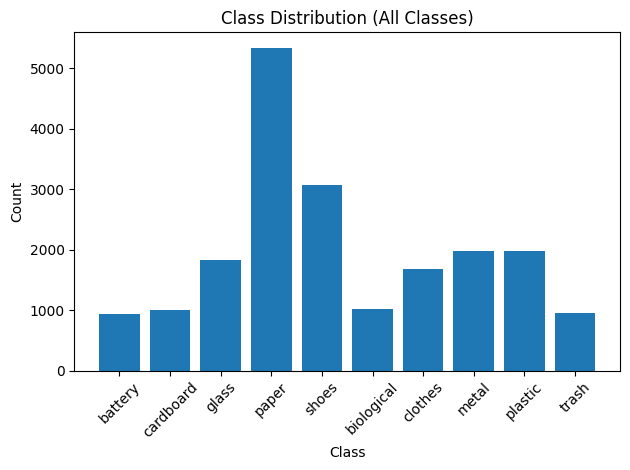

In [ ]:
WasteClassification_classes = ["battery", "cardboard", "glass", "paper", "shoes",
    "biological", "clothes", "metal", "plastic", "trash"]

WasteClassification_counts = [0] * len(WasteClassification_classes)

for label in full_set2.targets:
    WasteClassification_counts[label] += 1

plt.bar(WasteClassification_classes, WasteClassification_counts)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution (All Classes)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Now we will take same uniform stratified sampling approach

#Data Split Logic
---


We iterate through the dataset to assign an index to each (image, label) pair. Then, we group the indices by class into separate lists.

For each class, we determine the cutoff based in the following split:
* 50% training
* 50% validation
* 0% test

These class-wise indices are then added to their respective sets: val_idxs, test_idxs, and train_idxs. Finally, we create Subset objects for training, validation, and testing using those index lists.


we did that in uniform strat sampling

now we gotta concatenate these TrashNet_set and WasteClassication_set

In [ ]:
waste_train = train_set
waste_val = val_set
print(f"size of waste trains set is {len(waste_train)}")
print(f"size of waste trains val is {len(waste_val)}")



size of waste trains set is 2400
size of waste trains val is 300


#Chat its so over






---

1. add train() function
2. add get_accuracy() function

---

In [ ]:
def get_model_name(model, batch_size, learning_rate, epoch):
    path = "model_{0}_bs{1}_lr{2}_epoch{3}".format(model.__class__.__name__, batch_size,learning_rate, epoch)
    return path

def get_accuracy(model, dataset, use_cuda=False, batch_size=64):
    model.eval()
    correct = 0
    total = 0
    #loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, num_workers=8)
    loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, num_workers=2)

    with torch.no_grad():
        for imgs, labels in loader:
            if use_cuda and torch.cuda.is_available():
                imgs = imgs.cuda()
                labels = labels.cuda()
            output = model(imgs)
            pred = output.argmax(dim=1)
            correct += (pred == labels).sum().item()
            total += imgs.size(0)

    return correct / total


def train(model, train_set, val_set, batch_size, lr, num_epochs, use_cuda):
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0)

    train_losses, valid_losses = [], []
    train_accs, valid_accs = [], []

    if use_cuda and torch.cuda.is_available():
        model = model.cuda()

    train_loader = torch.utils.data.DataLoader(
        train_set, batch_size=batch_size, num_workers=2, pin_memory=True, shuffle=True
    )
    val_loader = torch.utils.data.DataLoader(
        val_set, batch_size=batch_size, num_workers=2, pin_memory=True, shuffle=False
    )

    for epoch in range(num_epochs):
        model.train()
        running_train_loss = 0.0

        for imgs, labels in train_loader:
            if use_cuda and torch.cuda.is_available():
                imgs, labels = imgs.cuda(non_blocking=True), labels.cuda(non_blocking=True)

            out = model(imgs)
            loss = criterion(out, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_train_loss += loss.item()

        model.eval()
        running_val_loss = 0.0
        with torch.no_grad():
            for imgs, labels in val_loader:
                if use_cuda and torch.cuda.is_available():
                    imgs, labels = imgs.cuda(non_blocking=True), labels.cuda(non_blocking=True)

                out = model(imgs)
                loss = criterion(out, labels)
                running_val_loss += loss.item()

        avg_train_loss = running_train_loss / len(train_loader)
        avg_val_loss = running_val_loss / len(val_loader)

        train_accuracy = get_accuracy(model, train_set, use_cuda)
        val_accuracy = get_accuracy(model, val_set, use_cuda)

        train_losses.append(avg_train_loss)
        valid_losses.append(avg_val_loss)
        train_accs.append(train_accuracy)
        valid_accs.append(val_accuracy)

        print(f"Epoch {epoch+1}: Train Loss = {avg_train_loss:.4f}, Val Loss = {avg_val_loss:.4f}")
        print(f"              Train Acc  = {train_accuracy:.4f},   Val Acc  = {val_accuracy:.4f}")

        model_path = get_model_name(model, batch_size, lr, epoch)
        torch.save(model.state_dict(), model_path)

    print('Finished Training')

    plt.plot(train_losses, label="Train Loss")
    plt.plot(valid_losses, label="Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Training & Validation Loss")
    plt.show()

    plt.plot(train_accs, label="Train Accuracy")
    plt.plot(valid_accs, label="Validation Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.title("Training & Validation Accuracy")
    plt.show()


def confusion_matrix(model, dataset, batch_size =64, use_cuda=False):
  matrix = torch.zeros(10,10)
  loader = torch.utils.data.DataLoader(dataset, batch_size)
  for imgs, labels in loader:

    if use_cuda and torch.cuda.is_available():
      imgs = imgs.cuda()
      labels = labels.cuda()
      matrix = matrix.cuda()

    output = model(imgs)
    pred = output.max(1, keepdim=True)[1]

    for i, l in enumerate(labels):
      matrix[pred[i].item()][l.item()] += 1
      # transoise by swapping indeces if necessare
  return matrix

import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

def plot_normalized_confusion_matrix(matrix, class_names, title="Confusion Matrix"):
    plotted_conf_matirx = pd.DataFrame(matrix.cpu().numpy(), index=class_names, columns=class_names)
    plt.figure(figsize=(8, 6))
    sns.heatmap(plotted_conf_matirx, annot=True, fmt=".2f", cmap="Blues", cbar=True)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(title)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

**Baseline Model:**

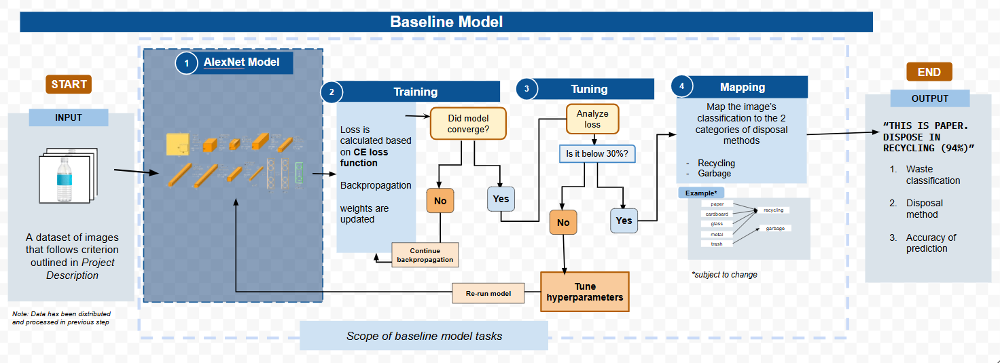

Import the modules necessary


In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms
import torch.optim as optim

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 191MB/s]


GPU is available
model_str_bs16_lr0.0001_epoch10
Epoch 1: Train Loss = 1.2452, Val Loss = 0.9281
              Train Acc  = 0.7150,   Val Acc  = 0.6967
Epoch 2: Train Loss = 0.8490, Val Loss = 0.7633
              Train Acc  = 0.7858,   Val Acc  = 0.7533
Epoch 3: Train Loss = 0.7028, Val Loss = 0.7331
              Train Acc  = 0.8221,   Val Acc  = 0.7233
Epoch 4: Train Loss = 0.6491, Val Loss = 0.6692
              Train Acc  = 0.8433,   Val Acc  = 0.7833
Epoch 5: Train Loss = 0.6118, Val Loss = 0.7186
              Train Acc  = 0.8429,   Val Acc  = 0.7733
Epoch 6: Train Loss = 0.5454, Val Loss = 0.6857
              Train Acc  = 0.8671,   Val Acc  = 0.7667
Epoch 7: Train Loss = 0.5007, Val Loss = 0.6464
              Train Acc  = 0.8704,   Val Acc  = 0.7433
Epoch 8: Train Loss = 0.5124, Val Loss = 0.7074
              Train Acc  = 0.8875,   Val Acc  = 0.7733
Epoch 9: Train Loss = 0.4692, Val Loss = 0.6207
              Train Acc  = 0.8908,   Val Acc  = 0.7800
Epoch 10: Train Loss = 0

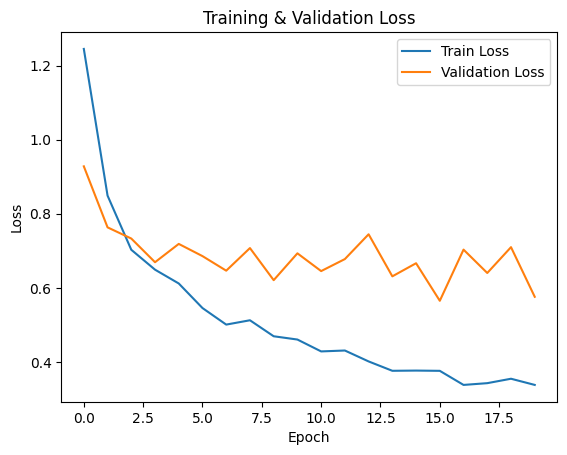

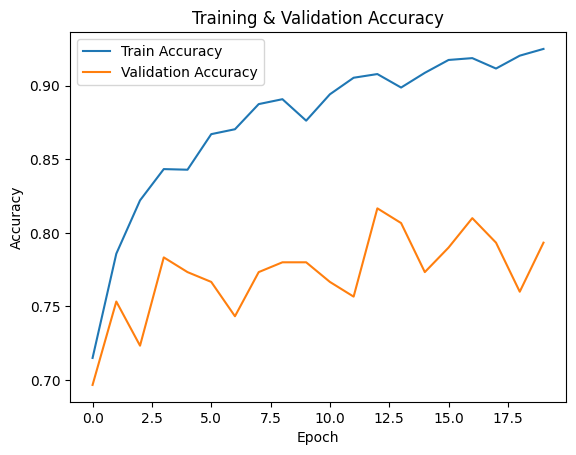

In [ ]:
#AlexNet Baseline Model:

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader

from torchvision.models import AlexNet_Weights

#load AlexNet model with pretrained ImageNet weights
alexNet = models.alexnet(weights=AlexNet_Weights.IMAGENET1K_V1)

#freeze earlier layers (preserve low level features)
# unfreeze later layers (to fine-tune)
for idx, param in enumerate(alexNet.features.parameters()):
    if idx >= 8:  # Unfreeze last layers (adjust index if needed)
        param.requires_grad = True
    else:
        param.requires_grad = False

# makes sure the fully connected layer matches with the number of classes
num_classes = 10
alexNet.classifier[6] = nn.Linear(alexNet.classifier[6].in_features, num_classes)

# use GPU if available
if torch.cuda.is_available():
    print("GPU is available")
    alexNet = alexNet.cuda()


# data loader for training and validation sets
train_loader = DataLoader(train_set, batch_size=16, shuffle=True)
val_loader = DataLoader(val_set, batch_size=16, shuffle=False)

# defines loss function
criterion = nn.CrossEntropyLoss()

#Uses Adam optimizer
optimizer = optim.Adam(filter(lambda p: p.requires_grad, alexNet.parameters()), lr=0.0001) #revise in the future?

#number of training epochs
num_epochs = 20

#creates model name
model_name = get_model_name("AlexNet", batch_size=16, learning_rate=0.0001, epoch=10)
print(model_name)

#trains model
train(
    model=alexNet,
    train_set=train_set,
    val_set=val_set,
    batch_size=16,
    lr=0.0001,
    num_epochs=num_epochs,
    use_cuda=True
)

#saves trained model
model_name = get_model_name("AlexNet", 16, 0.0001, num_epochs)
torch.save(alexNet.state_dict(), model_name + ".pth")


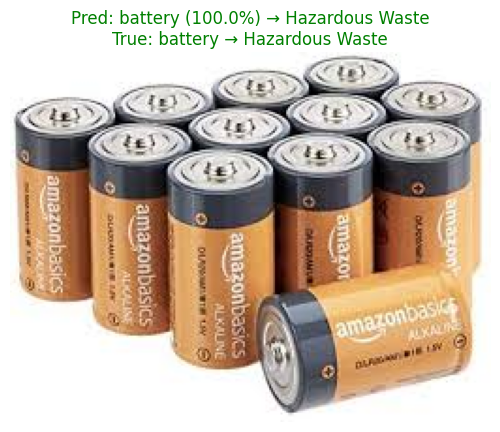

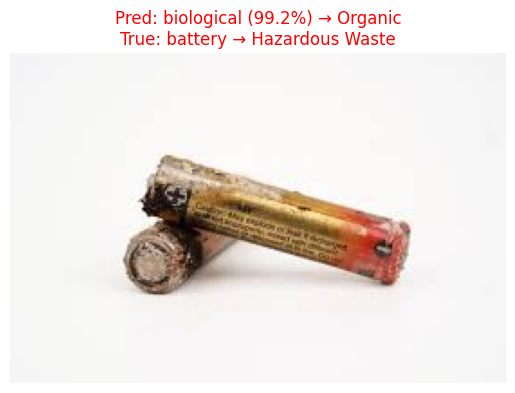

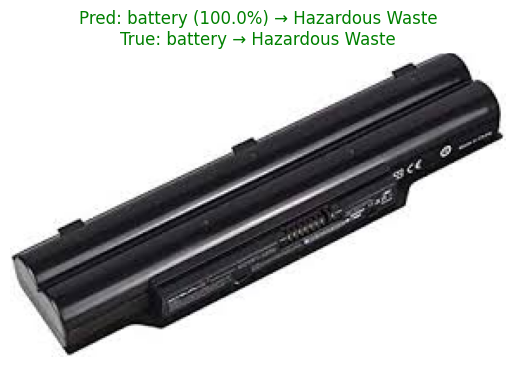

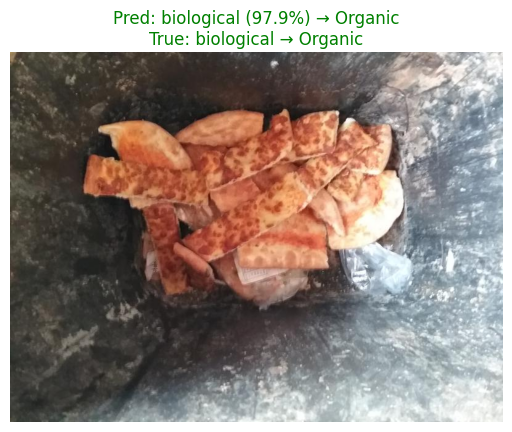

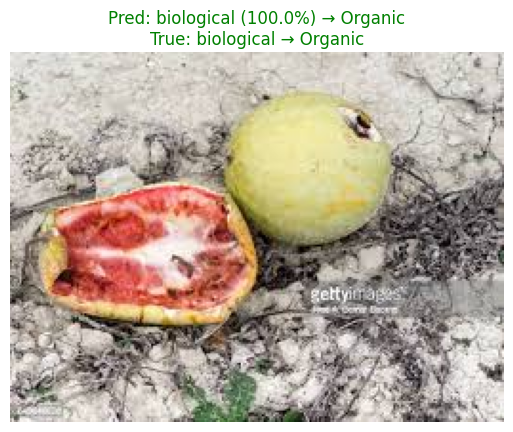

...

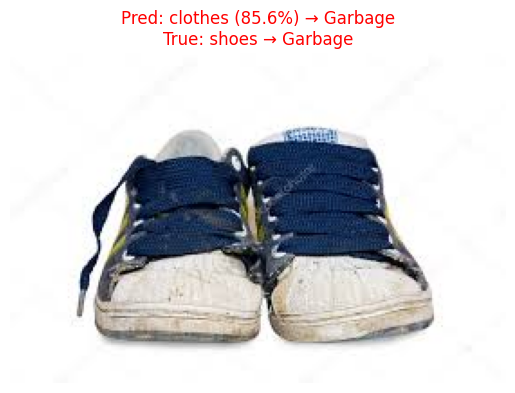

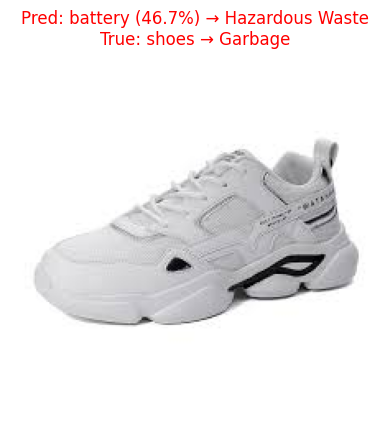

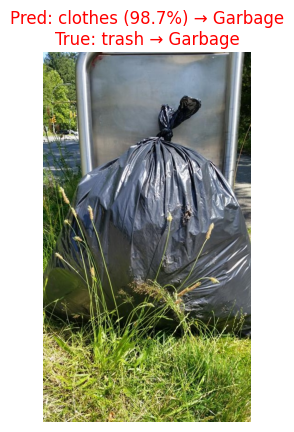

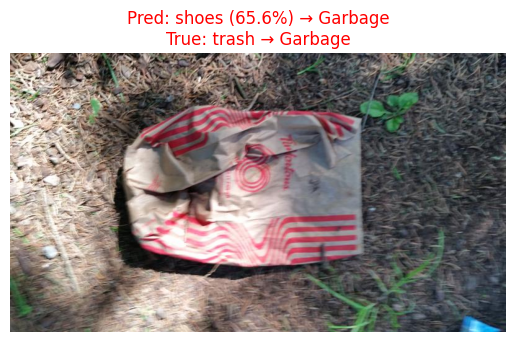

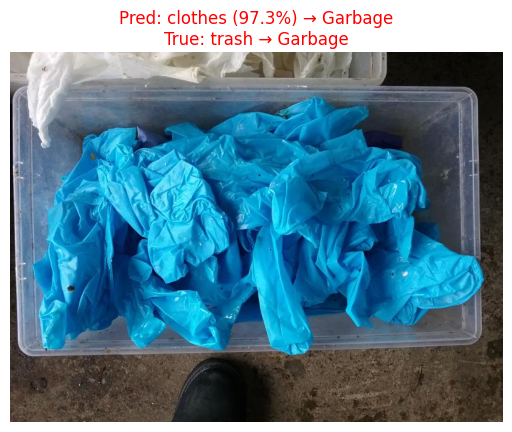

In [ ]:
import os
import random
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt

# ---- PATH AND SETUP ----
root_dir = "/content/drive/MyDrive/APS360 Group Project/Test Set"

# Replace this with your actual class names or dataset object
class_names = sorted(os.listdir(root_dir))  # Assumes each subfolder is a class

# Waste-to-disposal mapping
waste_disposal_map = {
    'battery': 'Hazardous Waste',
    'biological': 'Organic',
    'cardboard': 'Recycling',
    'clothes': 'Garbage',
    'glass': 'Recycling',
    'metal': 'Recycling',
    'paper': 'Recycling',
    'plastic': 'Recycling',
    'shoes': 'Garbage',
    'trash': 'Garbage'
}

model = alexNet
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Image transform matching model's training config (e.g., ImageNet)
transform = data_transform1

# ---- PREDICTION FUNCTION ----
def predict_from_drive(model, root_dir, class_names, max_images_per_class=3):
    for class_folder in class_names:
        folder_path = os.path.join(root_dir, class_folder)
        if not os.path.isdir(folder_path):
            continue

        # Select image files and shuffle
        image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        random.shuffle(image_files)
        selected_files = image_files[:max_images_per_class]

        for filename in selected_files:
            img_path = os.path.join(folder_path, filename)
            try:
                img = Image.open(img_path).convert("RGB")
            except Exception as e:
                print(f"Error loading image {filename}: {e}")
                continue

            input_tensor = transform(img).unsqueeze(0)  # Add batch dimension
            input_tensor = input_tensor.to(device)

            with torch.no_grad():
                output = model(input_tensor)
                probs = torch.softmax(output, dim=1)
                pred_idx = torch.argmax(probs, dim=1).item()
                confidence = probs[0, pred_idx].item()

            pred_class = class_names[pred_idx]
            true_class = class_folder
            pred_disposal = waste_disposal_map.get(pred_class, "Unknown")
            true_disposal = waste_disposal_map.get(true_class, "Unknown")

            # Plotting
            plt.imshow(img)
            plt.axis('off')
            plt.title(
                f"Pred: {pred_class} ({confidence*100:.1f}%) → {pred_disposal}\n"
                f"True: {true_class} → {true_disposal}",
                color='green' if pred_class == true_class else 'red'
            )
            plt.show()

# ---- CALL FUNCTION ----
predict_from_drive(model, root_dir, class_names)


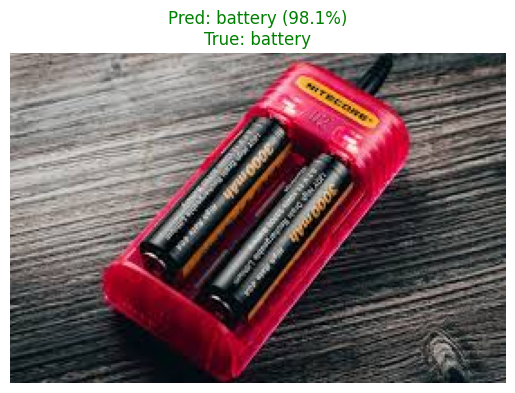

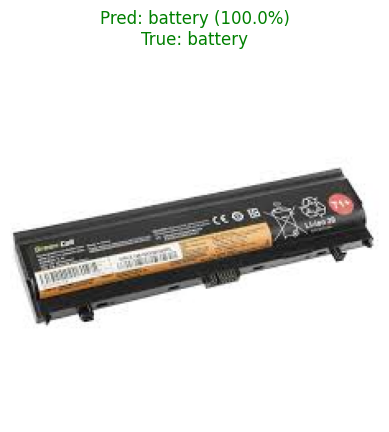

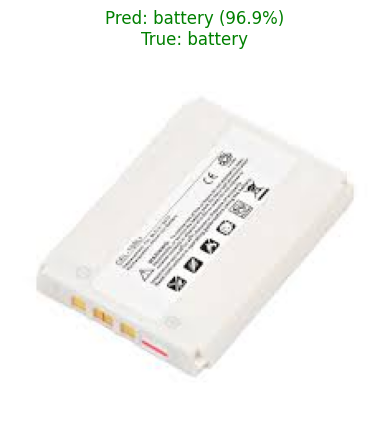

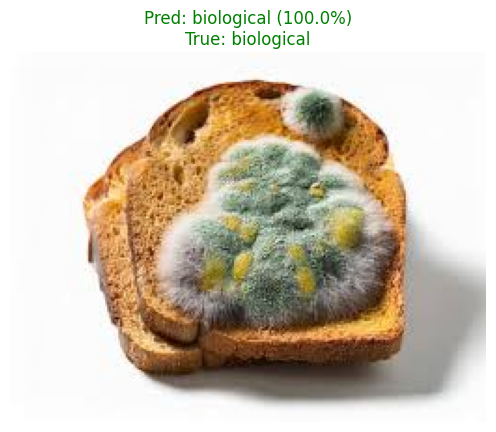

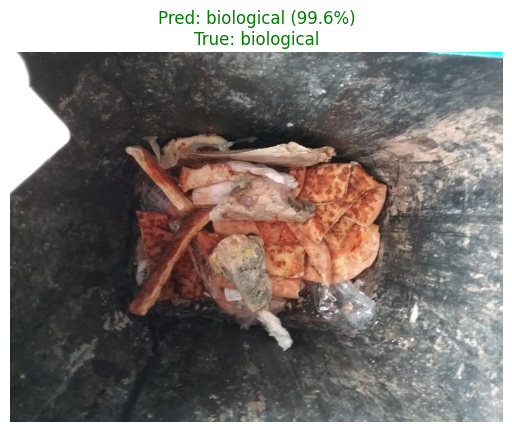

...

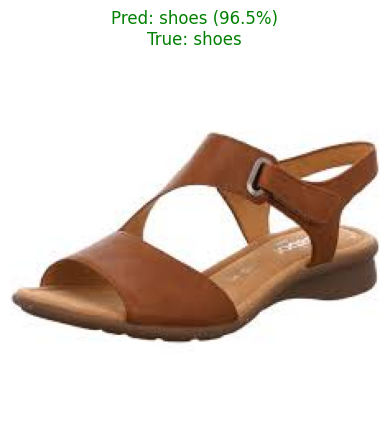

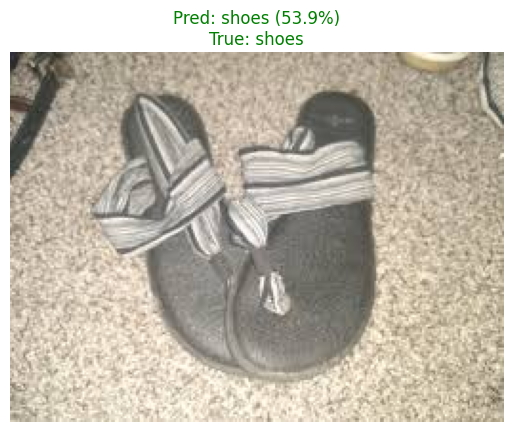

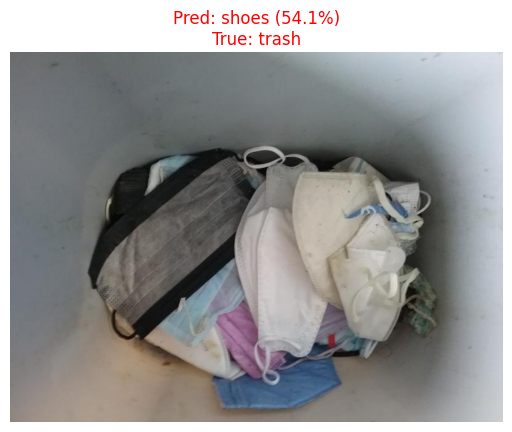

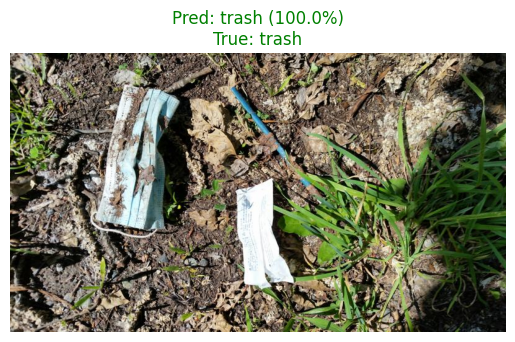

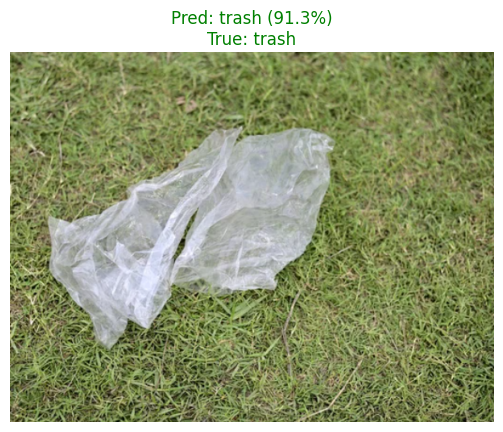

In [ ]:
import os
import random
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt

# ---- PATH AND SETUP ----
root_dir = "/content/drive/MyDrive/APS360 Group Project/Test Set"

# Replace this with your actual class names or dataset object
class_names = sorted(os.listdir(root_dir))  # Assumes each subfolder is a class

model = alexNet
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)


# Image transform matching model's training config (e.g., ImageNet)
transform = data_transform1

# ---- PREDICTION FUNCTION ----
def predict_from_drive(model, root_dir, class_names, max_images_per_class=3):
    for class_folder in class_names:
        folder_path = os.path.join(root_dir, class_folder)
        if not os.path.isdir(folder_path):
            continue

        # Select image files and shuffle
        image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        random.shuffle(image_files)
        selected_files = image_files[:max_images_per_class]

        for filename in selected_files:
            img_path = os.path.join(folder_path, filename)
            try:
                img = Image.open(img_path).convert("RGB")
            except Exception as e:
                print(f"Error loading image {filename}: {e}")
                continue

            input_tensor = transform(img).unsqueeze(0)  # Add batch dimension
            input_tensor = input_tensor.to(device)

            with torch.no_grad():
                output = model(input_tensor)
                probs = torch.softmax(output, dim=1)
                pred_idx = torch.argmax(probs, dim=1).item()
                confidence = probs[0, pred_idx].item()

            # Plotting
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Pred: {class_names[pred_idx]} ({confidence*100:.1f}%)\nTrue: {class_folder}",
                      color='green' if class_names[pred_idx] == class_folder else 'red')
            plt.show()

# ---- CALL FUNCTION ----
predict_from_drive(model, root_dir, class_names)

In [ ]:
len(train_set)

2400

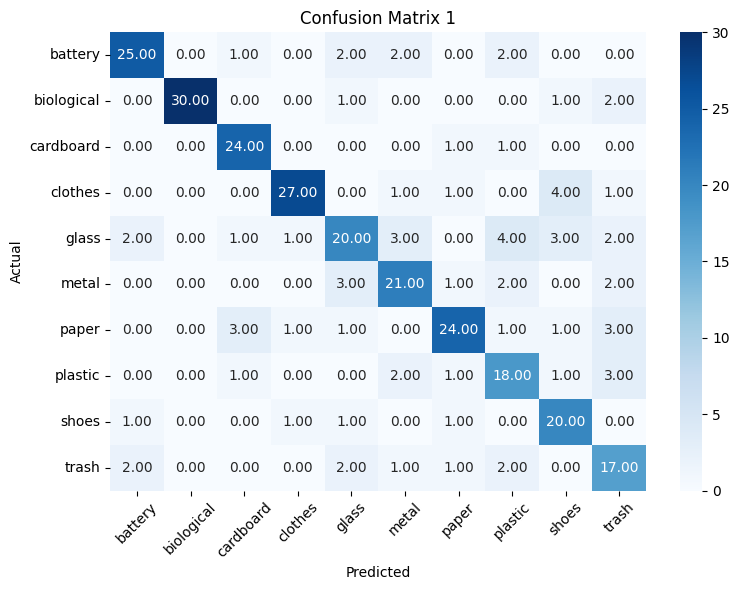

In [ ]:
true_labels = full_set2.classes
cf_mat1 = confusion_matrix(alexNet.cpu(), val_set, use_cuda=False)


plot_normalized_confusion_matrix(cf_mat1, true_labels, title = "Confusion Matrix 1")

### PRIMARY:

In [ ]:
torch.cuda.empty_cache()

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
from torchvision import datasets, transforms, models
from torchvision.models import resnet18, ResNet18_Weights
from torch.utils.data import DataLoader, Subset
from collections import defaultdict
import random
import matplotlib.pyplot as plt

# Custom GeM Pooling Layer
class GeM(nn.Module):
    def __init__(self, p=3.0, eps=1e-6):
        super(GeM, self).__init__()
        self.p = nn.Parameter(torch.ones(1) * p)
        self.eps = eps

    def forward(self, x):
        return torch.pow(
            torch.mean(torch.pow(x.clamp(min=self.eps), self.p), dim=(-1, -2), keepdim=True),
            1.0 / self.p
        )

# ResNet18-based Classifier
class SimpleResNet18(nn.Module):
    def __init__(self, num_classes=10):
        super(SimpleResNet18, self).__init__()
        self.backbone = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        self.backbone.avgpool = GeM(p=3.0)
        self.backbone.fc = nn.Identity()
        self.head = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.backbone(x)
        x = torch.flatten(x, 1)
        return self.head(x)

## Data transforms
#transform = transforms.Compose([
#    transforms.Resize((224, 224)),
#    transforms.ToTensor(),
#    transforms.Normalize([0.485, 0.456, 0.406],
#                         [0.229, 0.224, 0.225])
#])

# Stratified subsample function

#def stratified_subsample(dataset, samples_per_class=1000):
#    class_indices = defaultdict(list)
#    for idx, (_, label) in enumerate(dataset):
#        class_indices[label].append(idx)
#    selected_indices = []
#    for indices in class_indices.values():
#        random.shuffle(indices)
#        selected_indices.extend(indices[:samples_per_class])
#    return Subset(dataset, selected_indices)

# Load CIFAR-10 data
#train_set = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
#test_set = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
#train_set = stratified_subsample(train_set, samples_per_class=1000)

train_loader = DataLoader(waste_train, batch_size=64, shuffle=True)
val_loader = DataLoader(waste_val, batch_size=64, shuffle=False)
#print(f"check size to make sure its the actual garbage")

# Initialize model, optimizer, and scheduler
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SimpleResNet18(num_classes=10).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-5)
scheduler = StepLR(optimizer, step_size=10, gamma=0.5)

# Training function
import time

def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=20, device="cuda"):
    train_acc, val_acc = [], []

    if device == "cuda" and torch.cuda.is_available():
        model = model.cuda()

    for epoch in range(num_epochs):
        start_time = time.time()

        model.train()
        correct, total = 0, 0
        running_loss = 0.0

        for batch_idx, (imgs, labels) in enumerate(train_loader):
            imgs, labels = imgs.to(device, non_blocking=True), labels.to(device, non_blocking=True)

            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            running_loss += loss.item()

            # Show progress every 10 batches
            if batch_idx % 10 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Step [{batch_idx}/{len(train_loader)}], "
                      f"Loss: {loss.item():.4f}")

        train_accuracy = correct / total
        train_acc.append(train_accuracy)

        # Validation
        model.eval()
        correct, total = 0, 0
        with torch.no_grad():
            for imgs, labels in test_loader:
                imgs, labels = imgs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
                outputs = model(imgs)
                preds = outputs.argmax(dim=1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)
        val_accuracy = correct / total
        val_acc.append(val_accuracy)

        scheduler.step()

        epoch_time = time.time() - start_time
        print(f"Epoch {epoch+1} Summary: Train Acc = {train_accuracy:.4f}, "
              f"Val Acc = {val_accuracy:.4f}, Time = {epoch_time:.2f}s")

    return train_acc, val_acc


In [ ]:
# Train
train_model(model, train_loader, val_loader, criterion, optimizer, scheduler)


Epoch [1/20], Step [0/38], Loss: 2.8163
Epoch [1/20], Step [10/38], Loss: 1.4782
Epoch [1/20], Step [20/38], Loss: 0.7907
Epoch [1/20], Step [30/38], Loss: 0.7040
Epoch 1 Summary: Train Acc = 0.6008, Val Acc = 0.7633, Time = 29.76s
Epoch [2/20], Step [0/38], Loss: 0.5665
Epoch [2/20], Step [10/38], Loss: 0.7600
Epoch [2/20], Step [20/38], Loss: 0.5463
Epoch [2/20], Step [30/38], Loss: 0.5348
Epoch 2 Summary: Train Acc = 0.8033, Val Acc = 0.7733, Time = 29.14s
Epoch [3/20], Step [0/38], Loss: 0.5659
Epoch [3/20], Step [10/38], Loss: 0.4680
Epoch [3/20], Step [20/38], Loss: 0.4392
Epoch [3/20], Step [30/38], Loss: 0.4860
Epoch 3 Summary: Train Acc = 0.8475, Val Acc = 0.8300, Time = 29.93s
Epoch [4/20], Step [0/38], Loss: 0.4180
Epoch [4/20], Step [10/38], Loss: 0.4297
Epoch [4/20], Step [20/38], Loss: 0.2419
Epoch [4/20], Step [30/38], Loss: 0.4318
Epoch 4 Summary: Train Acc = 0.8708, Val Acc = 0.8200, Time = 30.29s
Epoch [5/20], Step [0/38], Loss: 0.3459
Epoch [5/20], Step [10/38], Loss

([0.6008333333333333,
  0.8033333333333333,
  0.8475,
  0.8708333333333333,
  0.8933333333333333,
  0.9033333333333333,
  0.9120833333333334,
  0.9125,
  0.9275,
  0.915,
  0.9379166666666666,
  0.9383333333333334,
  0.9408333333333333,
  0.9554166666666667,
  0.9470833333333334,
  0.9591666666666666,
  0.9466666666666667,
  0.9533333333333334,
  0.9558333333333333,
  0.955],
 [0.7633333333333333,
  0.7733333333333333,
  0.83,
  0.82,
  0.8233333333333334,
  0.83,
  0.82,
  0.8366666666666667,
  0.8533333333333334,
  0.8433333333333334,
  0.86,
  0.8433333333333334,
  0.8433333333333334,
  0.8766666666666667,
  0.85,
  0.85,
  0.8866666666666667,
  0.8466666666666667,
  0.88,
  0.8633333333333333])

In [ ]:
# Training function with loss tracking
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=20):
    train_acc, val_acc, train_loss = [], [], []

    for epoch in range(num_epochs):
        model.train()
        correct, total = 0, 0
        running_loss = 0.0

        for imgs, labels in train_loader:
            if torch.cuda.is_available():
                imgs, labels = imgs.cuda(), labels.cuda()
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * imgs.size(0)
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        epoch_loss = running_loss / total
        train_accuracy = correct / total
        train_acc.append(train_accuracy)
        train_loss.append(epoch_loss)

        # Validation
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model.to(device)
        model.eval()
        correct, total = 0, 0
        with torch.no_grad():
            for imgs, labels in test_loader:
                imgs, labels = imgs.to(device), labels.to(device)
                outputs = model(imgs)
                preds = outputs.argmax(dim=1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)
        val_accuracy = correct / total
        val_acc.append(val_accuracy)
        scheduler.step()

        print(f"Epoch {epoch+1}: Train Loss = {epoch_loss:.4f}, Train Acc = {train_accuracy:.4f}, Val Acc = {val_accuracy:.4f}")

    # Plot accuracy
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, num_epochs + 1), train_acc, label='Train Acc')
    plt.plot(range(1, num_epochs + 1), val_acc, label='Val Acc')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training vs Validation Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot training loss
    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), train_loss, label='Train Loss', color='red')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss Over Epochs')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

#train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=20)

In [ ]:
import os
import random
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt

# ---- PATH AND SETUP ----
root_dir = "/content/drive/MyDrive/APS360 Group Project/APS 360 Project/garbage-dataset"

# Replace this with your actual class names or dataset object
class_names = sorted(os.listdir(root_dir))  # Assumes each subfolder is a class

model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)


# Image transform matching model's training config (e.g., ImageNet)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# ---- PREDICTION FUNCTION ----
def predict_from_drive(model, root_dir, class_names, max_images_per_class=3):
    for class_folder in class_names:
        folder_path = os.path.join(root_dir, class_folder)
        if not os.path.isdir(folder_path):
            continue

        # Select image files and shuffle
        image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        random.shuffle(image_files)
        selected_files = image_files[:max_images_per_class]

        for filename in selected_files:
            img_path = os.path.join(folder_path, filename)
            try:
                img = Image.open(img_path).convert("RGB")
            except Exception as e:
                print(f"Error loading image {filename}: {e}")
                continue

            input_tensor = transform(img).unsqueeze(0)  # Add batch dimension
            input_tensor = input_tensor.to(device)

            with torch.no_grad():
                output = model(input_tensor)
                probs = torch.softmax(output, dim=1)
                pred_idx = torch.argmax(probs, dim=1).item()
                confidence = probs[0, pred_idx].item()

            # Plotting
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Pred: {class_names[pred_idx]} ({confidence*100:.1f}%)\nTrue: {class_folder}",
                      color='green' if class_names[pred_idx] == class_folder else 'red')
            plt.show()

# ---- CALL FUNCTION ----
predict_from_drive(model, root_dir, class_names)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/APS360 Group Project/APS 360 Project/garbage-dataset'

----

SANITY CHECK

----

In [ ]:

print(len(train_set))
print(len(val_set))


In [ ]:
# Clear GPU memory
torch.cuda.empty_cache()

# Re-seed
import numpy as np, random
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
random.seed(seed)

# Create model fresh
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model2 = SimpleResNet18(num_classes=10).to(device)

# Loss, optimizer, scheduler
criterion2 = nn.CrossEntropyLoss()
optimizer2 = optim.Adam(model2.parameters(), lr=0.0001, weight_decay=1e-5)
scheduler2 = StepLR(optimizer2, step_size=10, gamma=0.5)

# DataLoaders
train_loader2 = DataLoader(train_set, batch_size=256, shuffle=True)
val_loader2 = DataLoader(val_set, batch_size=64, shuffle=True)

# Train
train_model(model2, train_loader2, val_loader2, criterion2, optimizer2, scheduler2, num_epochs=20)


In [ ]:
true_labels = full_set2.classes
cf_mat2 = confusion_matrix(model2.cpu(), val_set, use_cuda=False)


plot_normalized_confusion_matrix(cf_mat2, true_labels, title = "Confusion Matrix 2")